In [76]:
import csv
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_theme(style="white")

In [10]:
## Locate the data
wine_path = "../practice_data/tabular_wine/winequality-white.csv"

## Load the data
wineq_numpy = np.loadtxt(wine_path, dtype=np.float32, 
                         delimiter=";", skiprows=1)
## Load the column names
col_list = next(csv.reader(open(wine_path), delimiter=";"))

## Construct a dataframe
df = pd.DataFrame(data=wineq_numpy, columns=col_list)
df.head(10)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.700001,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6.0
1,6.3,0.30,0.34,1.600000,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6.0
2,8.1,0.28,0.40,6.900000,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6.0
3,7.2,0.23,0.32,8.500000,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6.0
4,7.2,0.23,0.32,8.500000,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6.0
5,8.1,0.28,0.40,6.900000,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6.0
6,6.2,0.32,0.16,7.000000,0.045,30.0,136.0,0.9949,3.18,0.47,9.6,6.0
7,7.0,0.27,0.36,20.700001,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6.0
8,6.3,0.30,0.34,1.600000,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6.0
9,8.1,0.22,0.43,1.500000,0.044,28.0,129.0,0.9938,3.22,0.45,11.0,6.0


In [11]:
## Check for missing values
df.isna().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [12]:
x_cols = ['fixed acidity', 'volatile acidity', 'citric acid', 
          'residual sugar', 'chlorides', 'free sulfur dioxide', 
          'total sulfur dioxide', 'density', 'pH', 'sulphates', 
          'alcohol']

y_cols = ['quality']

<Axes: >

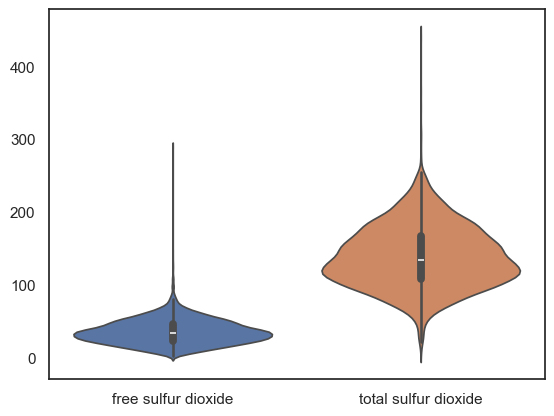

In [13]:
sns.violinplot(df[['free sulfur dioxide', 'total sulfur dioxide']])

<Axes: >

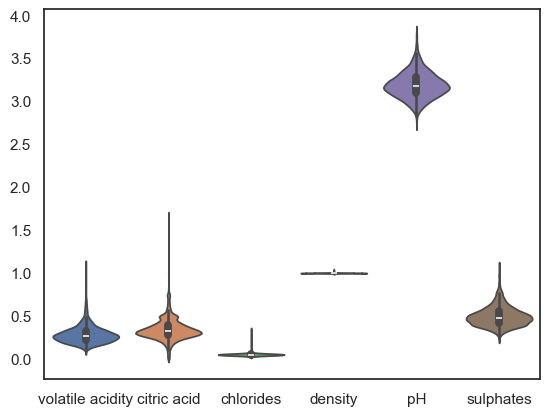

In [14]:
sns.violinplot(df[['volatile acidity', 'citric acid',
                  'chlorides', 'density', 'pH', 'sulphates']])

<Axes: >

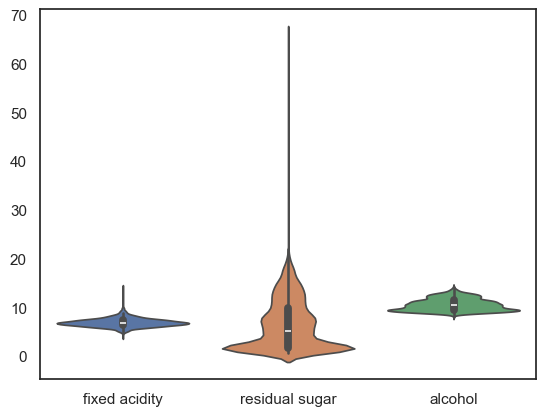

In [15]:
sns.violinplot(df[['fixed acidity', 'residual sugar', 'alcohol']])

<Axes: >

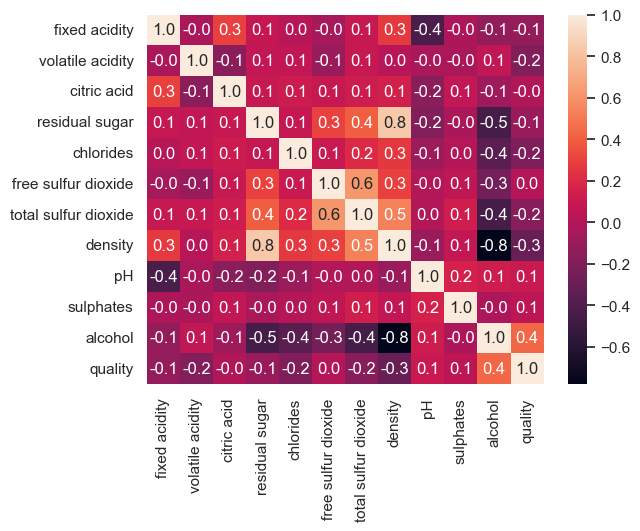

In [29]:
sns.heatmap(df.corr(), 
            fmt=".1f",
            annot=True)

In [31]:
df[['quality']].describe()

,quality
count,4898.000000
mean,5.877909
std,0.885639
min,3.000000
25%,5.000000
50%,6.000000
75%,6.000000
max,9.000000


In [53]:
df.quality.value_counts()

quality
6.0    2198
5.0    1457
7.0     880
8.0     175
4.0     163
3.0      20
9.0       5
Name: count, dtype: int64

In [67]:
## Add a column to indicate whether a wine is above avg
df['above_avg'] = df['quality'].apply(lambda x: 0 if x<=6 else 1)
## Add a column to indicate whether a wine is hi:2, mid:1, lo:0 
df['hi_mid_lo'] = df['quality'].apply(lambda x: 0 if x<5 else (1 if (x==5 or x==6) else 2))

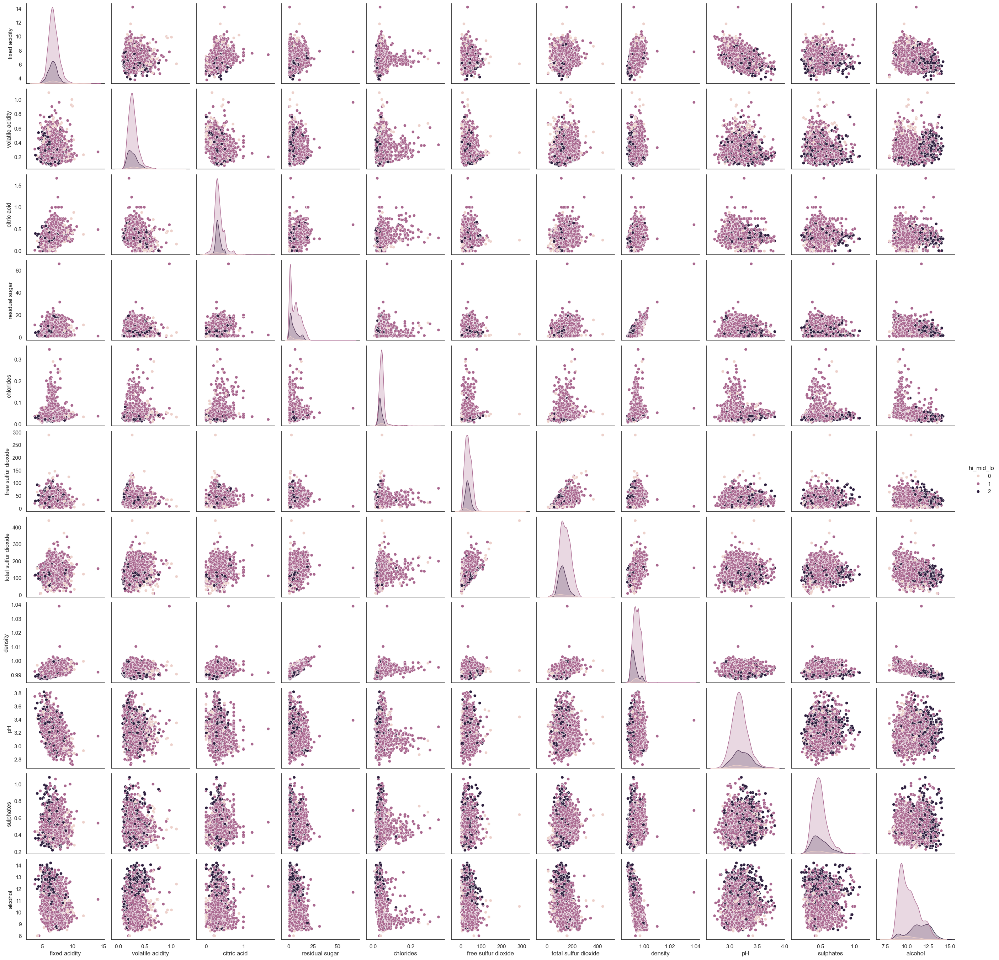

In [63]:
sns.pairplot(data=df[x_cols+['hi_mid_lo']], hue='hi_mid_lo')

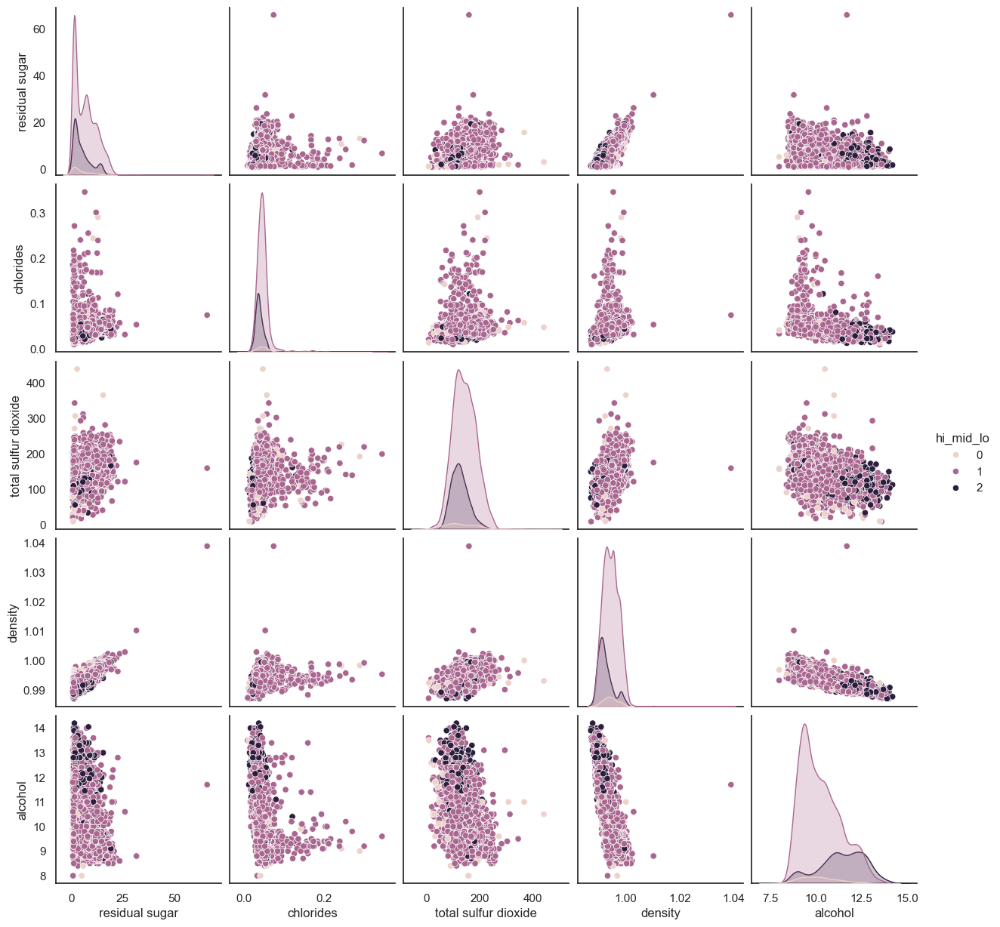

In [66]:
sns.pairplot(data=df[['residual sugar', 'chlorides', 'total sulfur dioxide',
                      'density', 'alcohol','hi_mid_lo']], hue='hi_mid_lo')

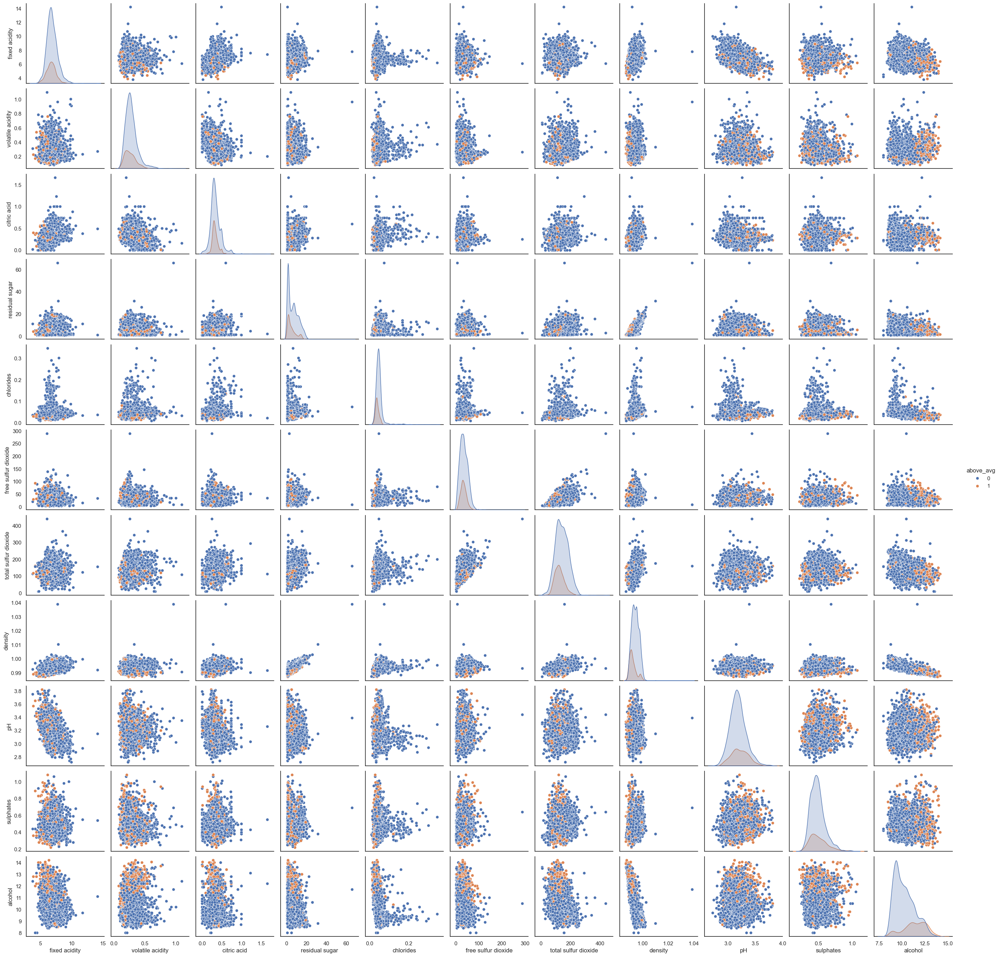

In [69]:
sns.pairplot(data=df[x_cols+['above_avg']], hue='above_avg')

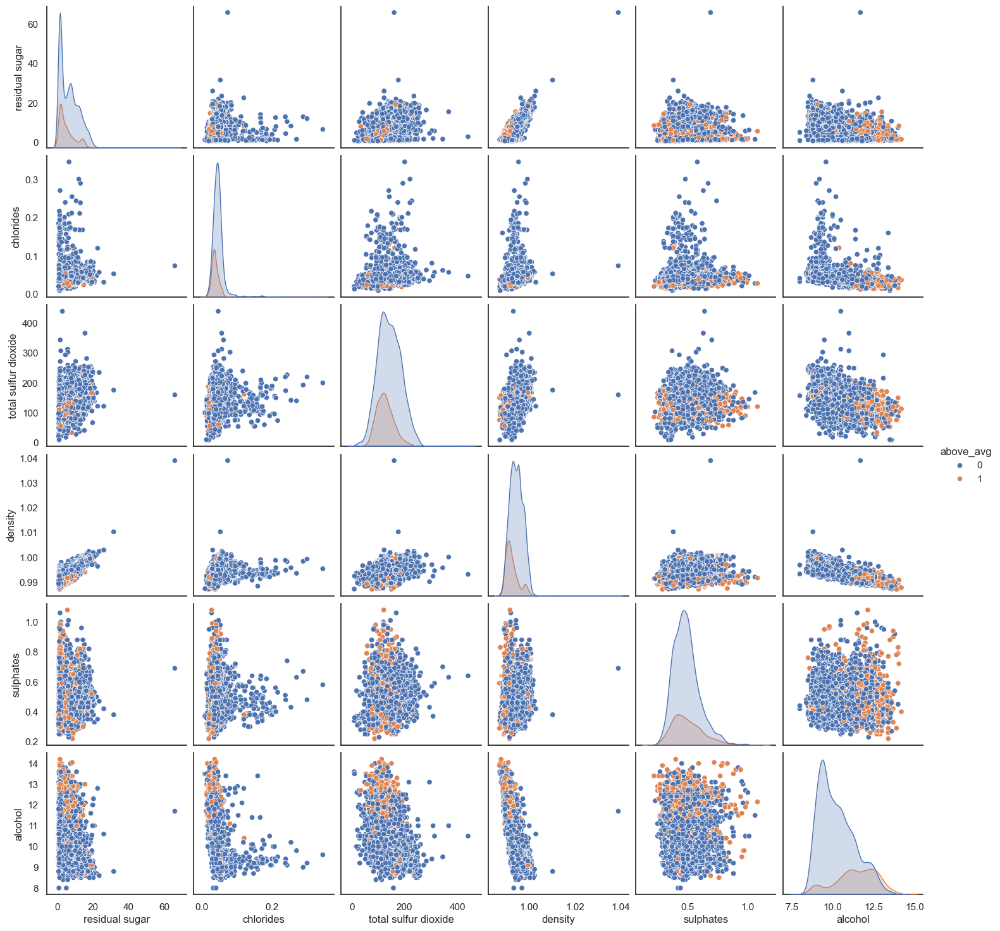

In [70]:
sns.pairplot(data=df[['residual sugar', 'chlorides', 'total sulfur dioxide',
                      'density', 'sulphates', 'alcohol','above_avg']], hue='above_avg')

In [ ]:
x_focus = ['residual sugar', 'chlorides', 
           'total sulfur dioxide', 'density', 
           'sulphates', 'alcohol']

## Playing with Dataset and DataLoader

In [158]:
class wineDataset(Dataset):
    def __init__(self, dataframe):
        self.residual_sugar = dataframe["residual sugar"]
        self.chlorides = dataframe["chlorides"]
        self.total_sulfur_dioxide = dataframe["total sulfur dioxide"]
        self.density = dataframe["density"]
        self.sulphates = dataframe["sulphates"]
        self.alcohol = dataframe["alcohol"]
        self.quality = dataframe["quality"]

    def __len__(self):
        return len(self.quality)

    def __getitem__(self, idx):
        residual_sugar = self.residual_sugar.iloc[idx]
        chlorides = self.chlorides.iloc[idx]
        total_sulfur_dioxide = self.total_sulfur_dioxide.iloc[idx]
        density = self.density.iloc[idx]
        sulphates = self.sulphates.iloc[idx]
        alcohol = self.alcohol.iloc[idx]
        quality = self.quality.iloc[idx]

        return residual_sugar, chlorides, total_sulfur_dioxide,\
            density, sulphates, alcohol, quality

In [159]:
wine_ds = wineDataset(df)

In [160]:
wine_ds

In [161]:
train_size = int(0.8 * len(wine_ds))
test_size = len(wine_ds) - train_size
wine_train, wine_test = torch.utils.data.random_split(wine_ds, [train_size, test_size])

In [162]:
wine_train, wine_test

(<torch.utils.data.dataset.Subset at 0x301a1e390>,
 <torch.utils.data.dataset.Subset at 0x304599550>)

In [163]:
train_dataloader = DataLoader(wine_train, batch_size=64, shuffle=True)
test_dataloader = DataLoader(wine_test, batch_size=64, shuffle=True)

In [164]:
train_dataloader, test_dataloader

(<torch.utils.data.dataloader.DataLoader at 0x30481acd0>,
 <torch.utils.data.dataloader.DataLoader at 0x304187b90>)

In [165]:
next(iter(train_dataloader))

[tensor([ 3.5000,  6.1000,  1.5000,  1.1000,  5.8000, 18.3000,  2.4000,  8.7000,
          2.0000,  1.0000, 12.5000,  3.5000, 12.3000,  6.8000,  2.1000, 12.7000,
          1.2000,  1.5000,  1.1000,  1.8000, 22.0000,  9.1000,  1.4000,  1.2000,
          2.9000,  1.3000, 13.4000, 13.2000,  6.2000,  4.5000,  1.2000,  5.6000,
          7.4000,  1.0000,  5.8000,  1.2000,  9.0000,  1.1000, 13.9000,  8.5000,
          1.2000, 11.8000,  1.8000, 13.2000,  4.5000,  8.3000,  1.1000,  1.4000,
          1.1000, 13.1000,  7.9000,  1.3000,  1.3000,  2.4000, 16.4000,  1.4000,
         14.3000,  5.0000,  7.4000,  6.1000, 17.5500,  1.8000, 15.5000,  1.2000]),
 tensor([0.0440, 0.0340, 0.0410, 0.0420, 0.0530, 0.0460, 0.1360, 0.0360, 0.0450,
         0.0420, 0.0370, 0.0330, 0.0350, 0.0550, 0.0390, 0.0470, 0.0500, 0.0350,
         0.0580, 0.0310, 0.0480, 0.0470, 0.2080, 0.0420, 0.0340, 0.0520, 0.0460,
         0.0440, 0.0490, 0.0300, 0.0520, 0.0470, 0.0530, 0.0300, 0.0400, 0.0340,
         0.0230, 0.1370, 0

In [167]:
next(iter(train_dataloader))[-1]

tensor([6., 6., 6., 5., 7., 5., 5., 6., 5., 5., 8., 5., 7., 6., 5., 5., 6., 6.,
        6., 6., 5., 6., 6., 8., 6., 3., 5., 5., 5., 5., 5., 7., 6., 6., 5., 6.,
        6., 6., 5., 6., 7., 6., 5., 6., 7., 5., 7., 8., 7., 6., 6., 5., 5., 6.,
        4., 5., 6., 7., 6., 5., 6., 5., 5., 8.])